In [2]:
from sklearn.datasets import fetch_california_housing

In [3]:
data = fetch_california_housing()

In [4]:
print(data['DESCR'])

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

In [5]:
X = data['data'].copy()
y = data['target'].copy()

## Exploratory Data Analysis

In [6]:
import pandas as pd

In [7]:
df = pd.DataFrame(X, columns=data['feature_names'])
df['target'] = y

In [8]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MedInc,20640.0,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
HouseAge,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20640.0,1.096675,0.473911,0.333333,1.006079,1.048780,1.099526,34.066667
Population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
Latitude,20640.0,35.631861,2.135952,32.540000,33.930000,34.260000,37.710000,41.950000
Longitude,20640.0,-119.569704,2.003532,-124.350000,-121.800000,-118.490000,-118.010000,-114.310000
target,20640.0,2.068558,1.153956,0.149990,1.196000,1.797000,2.647250,5.000010


In [9]:
df[df['AveOccup'] > 100].sort_values('AveOccup', ascending=False)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
19006,10.2264,45.0,3.166667,0.833333,7460.0,1243.333333,38.32,-121.98,1.375
3364,5.5179,36.0,5.142857,1.142857,4198.0,599.714286,40.41,-120.51,0.675
16669,4.2639,46.0,9.076923,1.307692,6532.0,502.461538,35.32,-120.70,3.500
13034,6.1359,52.0,8.275862,1.517241,6675.0,230.172414,38.69,-121.15,2.250


Mostly prisons

In [10]:
df[df['AveRooms'] > 50].sort_values('AveOccup', ascending=False)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
1914,1.8750,33.0,141.909091,25.636364,30.0,2.727273,38.91,-120.10,5.00001
1979,4.6250,34.0,132.533333,34.066667,36.0,2.400000,38.80,-120.08,1.62500
9676,3.2431,14.0,52.848214,11.410714,265.0,2.366071,37.64,-119.02,2.21400
11707,1.1912,22.0,52.690476,8.857143,98.0,2.333333,39.15,-120.06,1.70000
1913,4.0714,19.0,61.812500,11.000000,112.0,2.333333,39.01,-120.06,4.37500
1912,4.9750,16.0,56.269231,10.153846,54.0,2.076923,39.01,-120.16,2.06300
12447,1.6154,17.0,62.422222,14.111111,83.0,1.844444,33.97,-114.49,0.87500
11862,2.6250,25.0,59.875000,15.312500,28.0,1.750000,40.27,-121.25,0.67500
2395,3.8750,23.0,50.837838,10.270270,64.0,1.729730,37.12,-119.34,1.25000


Mostly hotels

In [11]:
import matplotlib.pyplot as plt

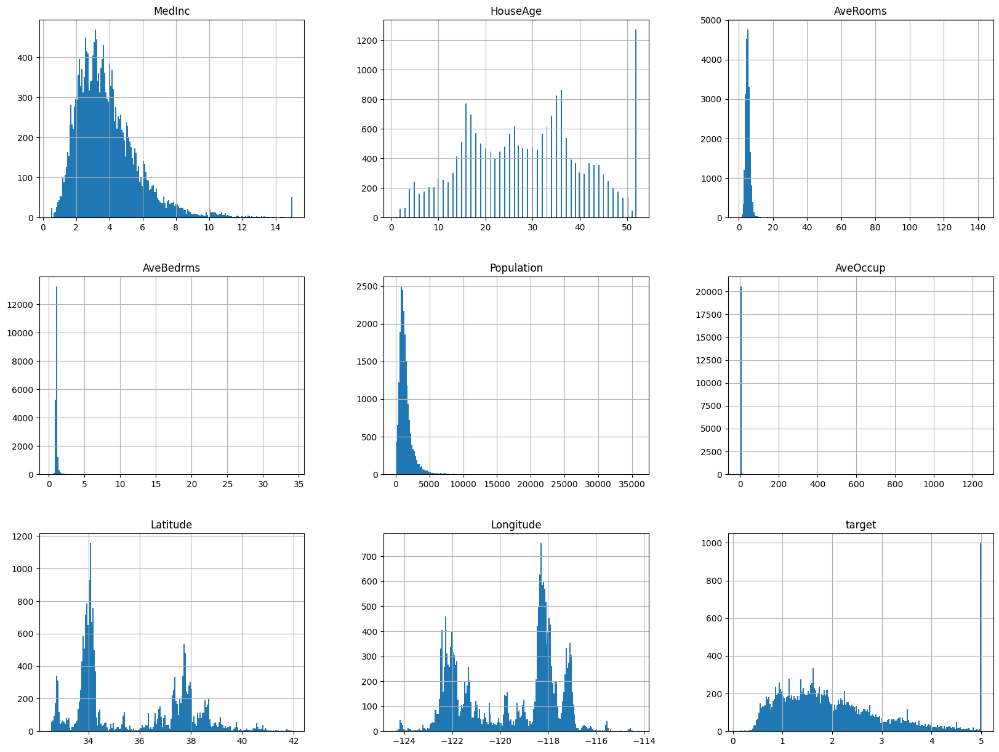

In [12]:
df.hist(bins=200, figsize=(20, 15))
plt.show()

<Axes: >

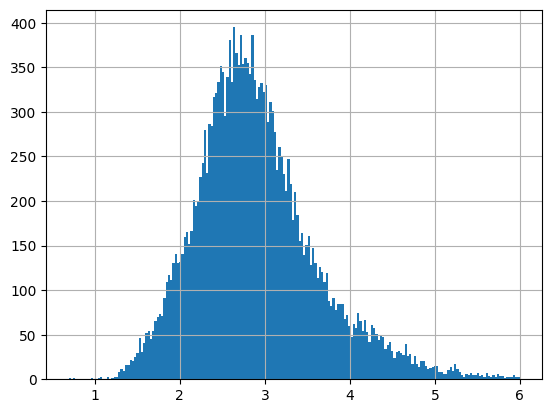

In [13]:
df[df['AveOccup'] < 6]['AveOccup'].hist(bins=200)

<Axes: >

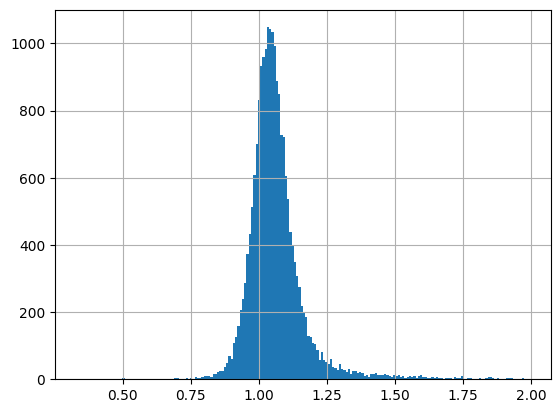

In [14]:
df[df['AveBedrms'] < 2]['AveBedrms'].hist(bins=200)

<Axes: >

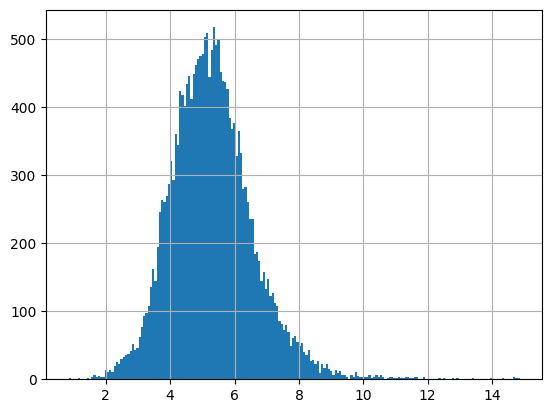

In [15]:
df[df['AveRooms'] < 15]['AveRooms'].hist(bins=200)

In [16]:
df = df[(df['AveOccup'] < 6) & (df['AveBedrms'] < 2) & (df['AveRooms'] < 15) &
        (df['MedInc'] < 14) & (df['HouseAge'] < 52) & (df['target'] < 5)]

In [17]:
df.shape

(18223, 9)

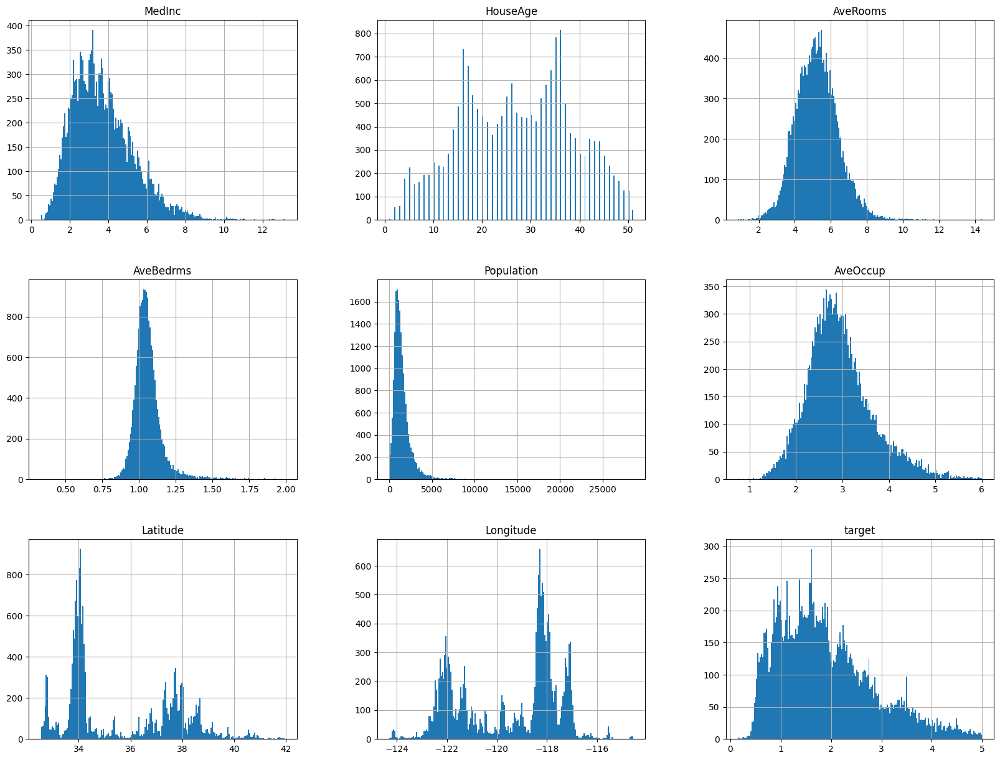

In [18]:
df.hist(bins=200, figsize=(20, 15))
plt.show()

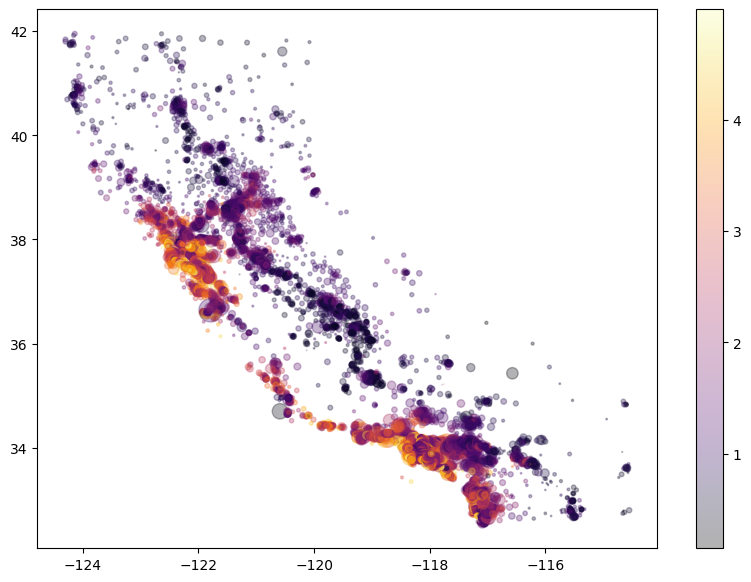

In [19]:
plt.figure(figsize=(10, 7))
plt.scatter(
    df['Longitude'],
    df['Latitude'],
    c=df['target'],
    cmap='inferno',
    s=df['Population'] / 100,
    alpha=0.3,
)
plt.colorbar()
plt.show()

In [20]:
import folium
from folium.plugins import HeatMap

map = folium.Map(
    location=[df['Latitude'].mean(), df['Longitude'].mean()],
    zoom_start=6,
)

In [21]:
import geopandas

geometry = geopandas.points_from_xy(df['Longitude'], df['Latitude'])
geo_df = geopandas.GeoDataFrame(df, geometry=geometry)

In [22]:
geo_map = geo_df.explore(column='target', m=map)

In [23]:
geo_map

In [24]:
import numpy as np

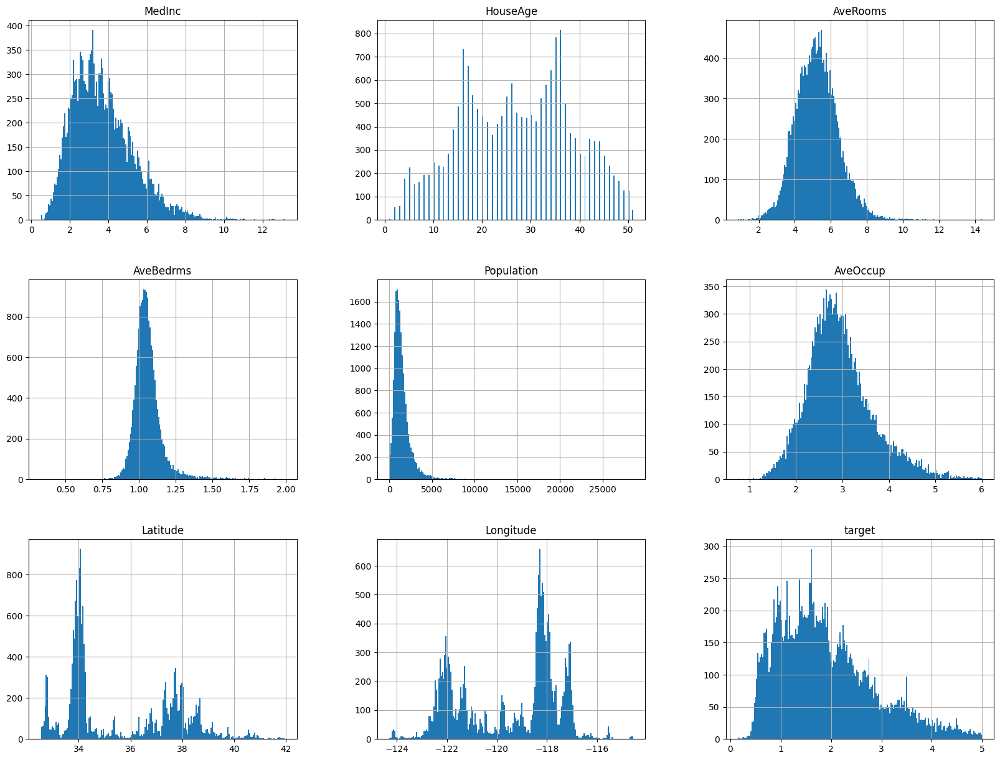

In [25]:
df.hist(bins=200, figsize=(20, 15))
plt.show()

In [26]:
def clean_data(X, y):
    df = pd.DataFrame(X.copy(), columns=data['feature_names'])
    df['target'] = y.copy()
    df = df[(df['AveOccup'] < 6) & (df['AveBedrms'] < 2) &
            (df['AveRooms'] < 15) & (df['MedInc'] < 14) & (df['HouseAge'] < 52)
            & (df['target'] < 5)]
    df['target'] = df['target'].apply(np.log)

    X = df.drop('target', axis=1).copy().values
    y = df['target'].copy().values

    return X, y

In [27]:
X = data['data']
y = data['target']

In [28]:
X_clean, y_clean = clean_data(X, y)
columns = data['feature_names']

In [29]:
import pickle

with open('X.npy', 'wb') as f:
    pickle.dump([X_clean, y_clean, columns], f)